# Исследование рынка заведений общественного питания Москвы

В моем распоряжении данные по заведениям общественного питания Москвы от сервисов Яндекс Карты и Яндекс Бизнес на лето 2022. Моя задача — провести исследование рынка, выявить интересные особенности и подготовить презентацию, которая поможет инвесторам из фонда «Shut Up and Take My Money» принять решение в выборе подходящего формата и места нового заведения.

Цель исследования:
1. Проанализировать имеющиеся данные и выявить закономерности;
2. Изучить сегмент кофеен;
3. Подготовить презентацию с результатами исследования.

Ход исследования:

Данные с результатами исследования я получу из файла `moscow_places.csv`.

Известно, что информация в сервисе Яндекс Бизнес могла быть добавлена пользователями или найдена в общедоступных источниках. Поэтому перед тем, как приступать к целям исследования, необходимо выполнить обзор данных и предварительную обработку.

Таким образом, мое исследование пройдет в шесть этапов:
- Обзор данных;
- Предобработка данных;
- Исследовательский анализ данных;
- Изучение сегмента кофеен;
- Подготовка презентации с выводами по исследованию.

### Обзор данных

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import datetime as dt
from plotly import graph_objects as go
import plotly.express as px
import folium

In [2]:
try:
    path = 'C:/Users/FORTREZZA/Desktop/Курс Дата-аналитика (Яндекс)/11. Презентация и оформление графиков/moscow_places.csv'
    data = pd.read_csv(path)
    print(data.head())
except:
    'File Not Found'

                   name  category                              address  \
0                WoWфли      кафе           Москва, улица Дыбенко, 7/1   
1        Четыре комнаты  ресторан   Москва, улица Дыбенко, 36, корп. 1   
2                 Хазри      кафе       Москва, Клязьминская улица, 15   
3  Dormouse Coffee Shop   кофейня  Москва, улица Маршала Федоренко, 12   
4             Иль Марко  пиццерия      Москва, Правобережная улица, 1Б   

                          district  \
0  Северный административный округ   
1  Северный административный округ   
2  Северный административный округ   
3  Северный административный округ   
4  Северный административный округ   

                                               hours        lat        lng  \
0                             ежедневно, 10:00–22:00  55.878494  37.478860   
1                             ежедневно, 10:00–22:00  55.875801  37.484479   
2  пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...  55.889146  37.525901   
3             

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Всего есть данные по 8406 заведениям общественного питания Москвы.

В данных имеются пропуски: не везде указан режим работы, уровень цен и количество посадочных мест.

Данные в некоторых столбцах представлены типом `object` и содержат как численные, так и буквенные символы.

### Предобработка данных

#### Проверка наличия явных дубликатов

In [4]:
data.duplicated().sum()

0

Дубликаты не обнаружены.

#### Проверка наличия неявных дубликатов

Очевидно, что неявные дубликаты в настоящем датасете могут быть представлены различным написанием названий сетевых заведений. Проверим, есть ли такие дубли.

In [5]:
dupl_chq = data[data['chain']==True].groupby('name')[['address']].nunique().reset_index().sort_values(
                                                                                    by='address',ascending=False)
dupl_chq['name'].unique()

array(['Шоколадница', "Домино'с Пицца", 'Додо Пицца', 'One Price Coffee',
       'Яндекс Лавка', 'Cofix', 'Prime', 'Хинкальная', 'КОФЕПОРТ',
       'Кулинарная лавка братьев Караваевых', 'Теремок', 'Чайхана',
       'CofeFest', 'Буханка', 'Му-Му', 'Drive Café', 'Кофемания',
       'АндерСон', 'Крошка Картошка', 'Cinnabon', 'French Bakery',
       'Скалка', 'Штолле', 'Тануки', 'Арамье', 'VASILCHUKÍ Chaihona №1',
       'Хлеб Насущный', 'СушиСтор', 'Osteria Mario', 'Кафетерий',
       'Моремания', 'МСК Lounge', 'Вареничная № 1', 'Бургер Кинг',
       'Pizza Express 24', 'Brasserie Lambic', 'Алло! Пицца',
       'Wild Bean Cafe', 'Pizza Hut', 'Правда кофе', 'Джонджоли',
       'Донер Кебаб', 'Халяль', 'Кафе-бар', 'Krispy Kreme', 'PhoBo',
       'Стейк & Бургер', 'Самарканд', 'Волконский', 'Bổ', 'Чайхона',
       'Kuzina', 'Академия', 'Udcкафе', 'Брусника', 'Франклинс Бургер',
       "Coffeekaldi's", 'ДаблБи', 'Пекарня', 'Грабли', 'Грузинская кухня',
       'IL Патио', '9 Bar Coffee', 'Хач

И такие дубликаты есть! Вот они:
- Wild Bean Cafe / Wild Bean / The Wild Bean Cafe / Wild bean cafe / The wild bean cafe
- Хинкали-Gали! / Хинкали - Gали!
- One&Double / Кофейня One&Double / One And Double
- Яндекс.Лавка / Яндекс Лавка
- Хлеб насущный / Хлеб Насущный
- City life / Сити Лайф
- Чайхана халяль / Чайхана Халяль
- Крошка картошка / Крошка Картошка

In [6]:
data = data.replace(['Wild Bean','The wild bean cafe','The Wild Bean Cafe','Wild bean cafe'], 'Wild Bean Cafe')
data = data.replace('Хинкали - Gали!', 'Хинкали-Gали!')
data = data.replace('Яндекс Лавка', 'Яндекс.Лавка')
data = data.replace('Хлеб насущный', 'Хлеб Насущный')
data = data.replace('Сити Лайф', 'City life')
data = data.replace('Чайхана халяль', 'Чайхана Халяль')
data = data.replace('Крошка картошка', 'Крошка Картошка')

#### Проверка на пропуски

Пропуски встречаются в столбцах `hours`, `price`, `avg_bill`, `middle_avg_bill`, `middle_coffee_cup` и `seats`.

In [7]:
print('Доля пропусков в столбце `hours` от длины датафрейма: ' + 
      str(round((data['hours'].isna().sum() / len(data)) * 100,1)) + ' %')
print('Доля пропусков в столбце `price` от длины датафрейма: ' + 
      str(round((data['price'].isna().sum() / len(data)) * 100,1)) + ' %')
print('Доля пропусков в столбце `avg_bill` от длины датафрейма: ' + 
      str(round((data['avg_bill'].isna().sum() / len(data)) * 100,1)) + ' %')
print('Доля пропусков в столбце `middle_avg_bill` от длины датафрейма: ' + 
      str(round((data['middle_avg_bill'].isna().sum() / len(data)) * 100,1)) + ' %')
print('Доля пропусков в столбце `middle_coffee_cup` от длины датафрейма: ' + 
      str(round((data['middle_coffee_cup'].isna().sum() / len(data)) * 100,1)) + ' %')
print('Доля пропусков в столбце `seats` от длины датафрейма: ' + 
      str(round((data['seats'].isna().sum() / len(data)) * 100,1)) + ' %')

Доля пропусков в столбце `hours` от длины датафрейма: 6.4 %
Доля пропусков в столбце `price` от длины датафрейма: 60.6 %
Доля пропусков в столбце `avg_bill` от длины датафрейма: 54.6 %
Доля пропусков в столбце `middle_avg_bill` от длины датафрейма: 62.5 %
Доля пропусков в столбце `middle_coffee_cup` от длины датафрейма: 93.6 %
Доля пропусков в столбце `seats` от длины датафрейма: 43.0 %


Очевидно, что доли пропусков в тех столбцах, где они имеются, составляют заметную часть датафрейма. Таким образом, принимаем решение оставить все как есть.

Создадим дополнительные столбцы `street` с выделенным из адреса названием улицы и `is_24/7` с булевым значением, работает ли заведение ежедневно и круглосуточно.

In [8]:
data['street'] = data['address'].str.split(', ').str[1]

In [9]:
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')

In [10]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


### Исследовательский анализ данных

#### Категории заведений

Посмотрим на распределение количества заведений в зависимости от категории.

In [11]:
# готовим данные для графиков
cat = pd.DataFrame(data['category'].value_counts()).reset_index()

In [12]:
# строим столбчатую диаграмму 
fig = px.bar(cat.sort_values(by='category', ascending=True), # загружаем данные и заново их сортируем
             x='category', # указываем столбец с данными для оси X
             y='index', # указываем столбец с данными для оси Y
             text='category' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве значений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Рейтинг количества заведений по категориям',
                   xaxis_title='Количество заведений',
                   yaxis_title='Категория')
fig.show() # выводим график

ТОП-3 формата заведений общественного питания в Москве:
1. кафе
2. рестораны
3. кофейни

Затем с заметным отставанием следуют иные категории.

Теперь посмотрим на доли этих категорий от общего числа заведений.

In [13]:
cat = pd.DataFrame(data['category'].value_counts()).reset_index()

fig = go.Figure(data=[go.Pie(labels=cat['index'], # указываем значения, которые появятся на метках сегментов
                             values=cat['category'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Доля заведений по категориям', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Категория',
                                    showarrow=False)])
fig.show() # выводим график

Кафе (28,3%) и рестораны (24,3%) занимают близкие доли рынка, затем идут кофейни (16,8%). Все остальные категории не преодолевают рубеж в 10%. 

#### Количество посадочных мест

Поскольку, как мы выяснили ранее, доля пропусков в данных по посадочным местам составляет 43%, чтобы корректно оценить их распределение по категориям придется взять срез данных, где эта информация указана.

In [14]:
total_seats = data.loc[data['seats'].notna()].groupby(['category'], as_index=False)[['seats']].sum()
total_seats['seats'] = total_seats['seats'].astype(int)

In [15]:
# строим столбчатую диаграмму 
fig = px.bar(total_seats.sort_values(by='seats', ascending=True), # загружаем данные и заново их сортируем
             x='seats', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='seats' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве значений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Рейтинг количества посадочных мест по категориям',
                   xaxis_title='Количество посадочных мест',
                   yaxis_title='Категория')
fig.show() # выводим график

Хотя ресторанов на 4% меньше, чем кафе, посадочных мест в заведениях такого формата заметно больше (и это с учетом того, что мы рассматриваем срез, равный примерно половине всего датасета). Третье место занимают кофейни.

Построим круговую диаграмму долей посадочных мест по категориям.

In [16]:
total_seats = total_seats.sort_values(by = 'seats', ascending = False)

fig = go.Figure(data=[go.Pie(labels=total_seats['category'], # указываем значения, которые появятся на метках сегментов
                             values=total_seats['seats'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Доля общего количества посадочных мест по категориям', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Категория',
                                    showarrow=False)])
fig.show() # выводим график

На рестораны приходится на 7% больше посадочных мест, чем на кафе. Далее следуют кофейни и бары. Остальные сегменты не преодолевают рубеж в 10%.

Однако общее количество посадочных мест по категориям не дает полной картины, поскольку, с одной стороны, в каждой из категорий есть свои нормы, с другой стороны, внутри каждой из категорий количество мест в отдельно взятых заведениях может сильно отличаться. Поэтому рассчитаем среднее значение количества посадочных мест для каждой из категорий.

In [17]:
ave_seats = data.loc[data['seats'].notna()].groupby(['category'], as_index=False)[['seats']].median().sort_values(
                                                                                        by = 'seats', ascending = False)
# строим столбчатую диаграмму 
fig = px.bar(ave_seats.sort_values(by='seats', ascending=True), # загружаем данные и заново их сортируем
             x='seats', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='seats' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве значений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Среднее количество посадочных мест в одном заведении',
                   xaxis_title='Количество посадочных мест',
                   yaxis_title='Категория')
fig.show() # выводим график

Неудивительно, что рестораны лидируют по общему количеству посадочных мест (154869), ведь и среднее количество в одном заведении больше, чем у других категорий (86). Зато интересную особенность видим далее - в барах и пабах среднее количество посадочных мест значительно больше, чем в кафе (86 / 60), однако общее количество мест меньше (58281 / 118770). Это объясняется тем, что кафе - самый популярный формат заведений. То же самое прослеживается относительно столовых - среднее количество большое (75,5), однако доля в общем числе малая (16359). Столовых гораздо меньше по городу, чем иных форматов. Кроме того, может иметь место вопрос престижа - хозяин скорее предпочтет отнести свое заведение к категории кафе, а не столовой. Тем временем, параметры кофеен более равномерно распределяются - они стабильно на 3-е месте и по количеству заведений (1413), и по общему число посадочных мест (83511), и по среднему количеству мест в одном заведении (80). 

#### Сетевые и несетевые заведения

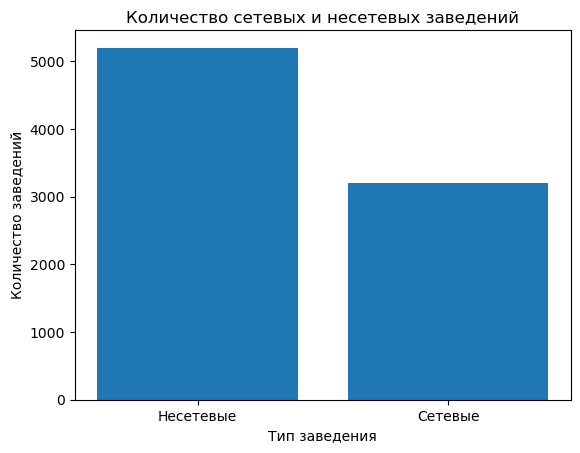

In [18]:
chain = data.groupby(['chain'], as_index=False)[['chain']].count()
chain['group'] = ['Несетевые','Сетевые']

plt.bar(chain['group'],chain['chain'])
plt.title('Количество сетевых и несетевых заведений')
     
plt.xlabel('Тип заведения')
plt.ylabel('Количество заведений')
plt.show()

In [19]:
fig = go.Figure(data=[go.Pie(labels=chain['group'], # указываем значения, которые появятся на метках сегментов
                             values=chain['chain'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Доля сетевых заведений', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Категория',
                                    showarrow=False)])
fig.show() # выводим график

Несетевых заведений примерно на 2000 или на 23,8% больше, чем сетевых.

#### Категории заведений в зависимости от принадлежности к сети

In [20]:
cat_chain = data.loc[data['chain'] == True].groupby(['category'], as_index=False)[['name']].count()

In [21]:
# строим столбчатую диаграмму 
fig = px.bar(cat_chain.sort_values(by='name', ascending=True), # загружаем данные и заново их сортируем
             x='name', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='name' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве значений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Рейтинг общего количества сетевых заведений по категориям',
                   xaxis_title='Количество заведений',
                   yaxis_title='Категория')
fig.show() # выводим график

Больше всего сетевых кафе (779 точек), затем примерно на одинаковом уровне рестораны (730) и кофейни (720), затем с большим отставанием идут остальные форматы. 

Теперь рассмотрим количество сетевых заведений относительно общего количества заведений в категории.

In [22]:
cat_chain = data.pivot_table(index = 'category',columns='chain',values='address',aggfunc=['count']).reset_index()
cat_chain.columns = cat_chain.columns.get_level_values(1)
cat_chain.columns = ['Категория','Несетевые','Сетевые']
#cat_chain['Всего'] = cat_chain['Несетевые'] + cat_chain['Сетевые']
cat_chain = cat_chain.sort_values(by='Сетевые', ascending=False)

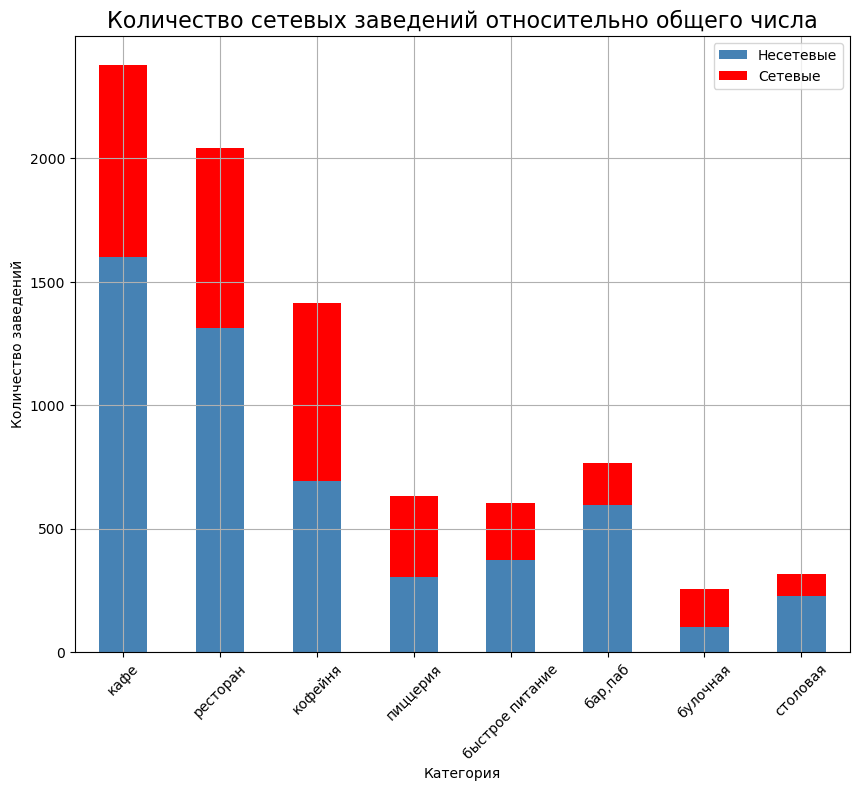

In [23]:
cat_chain.set_index('Категория').plot(kind='bar', stacked= True , color=['steelblue', 'red'],grid=True,figsize = (10, 8))

plt.title('Количество сетевых заведений относительно общего числа', fontsize= 16 )

plt.xlabel('Категория')
plt.ylabel('Количество заведений')

plt.xticks (rotation= 45)

plt.show()

- В категориях кафе, рестораны, быстрое питание примерно каждое третье заведение принадлежит сети;
- В категориях кофейни и пиццерии примерно половина заведений принадлежит сети;
- В категориях бары/пабы и столовые каждое четвертое заведение принадлежит сети;
- Больше половины булочных - сетевые.

#### ТОП-15 сетевых заведений

In [24]:
top_chain = data.loc[data['chain'] == True].groupby(['name'], as_index=False)[['address']].count()
top_chain= top_chain.sort_values(by='address',ascending=False).head(15)

In [25]:
# строим столбчатую диаграмму 
fig = px.bar(top_chain.sort_values(by='address', ascending=True), # загружаем данные и заново их сортируем
             x='address', # указываем столбец с данными для оси X
             y='name', # указываем столбец с данными для оси Y
             text='address' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве значений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='ТОП-15 сетей по количеству заведений',
                   xaxis_title='Количество заведений',
                   yaxis_title='Сеть')
fig.show() # выводим график

Бесспорным лидером рейтинга является сеть "Шоколадница" (120 точек), затем идут "Домино'с Пицца" (76) и "Додо Пицца" (74). Характерной особенностью данного рейтинга является то, что все заведения можно отнести к категории быстрого обслуживания: это кофейни, пиццерии, рестораны быстрого питания ("Теремок", "Хинкальная").

#### Количество заведений по административным районам

In [26]:
data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

В датасете представлено 9 административных округов Москвы.

In [27]:
dist = data.pivot_table(index = 'district',columns='category',values='address',aggfunc=['count'])
dist.columns = dist.columns.get_level_values(1)
dist.index.name = None
dist['ВСЕГО'] = dist.sum(axis=1)

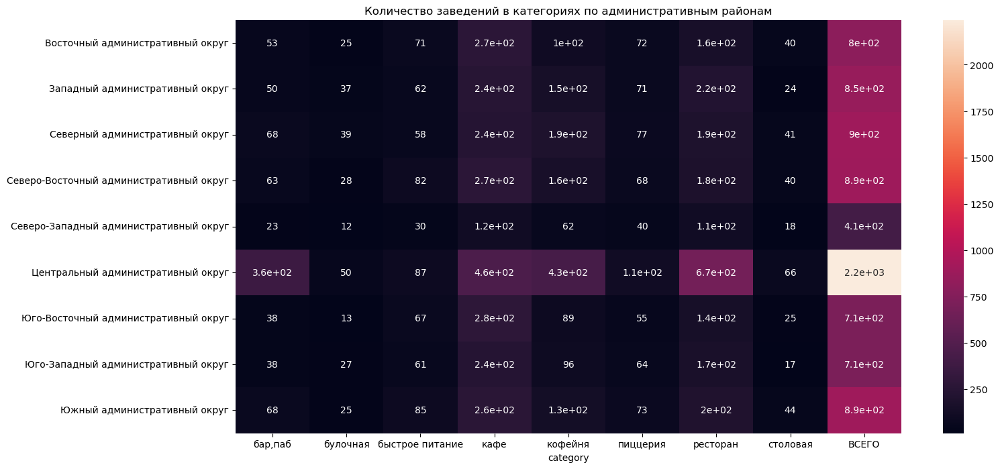

In [28]:
plt.figure(figsize=(16,8))
plt.title('Количество заведений в категориях по административным районам')
sns.heatmap(dist, annot=True)
plt.show()

- Наибольшая концентрация заведений вполне ожидаемо в ЦАО. Наименьшая концентрация - в СЗАО;
- ЦАО также по сути единственный концентратор заведений в формате бара/паба;
- Количество кафе и кофеен в ЦАО примерно в 1,5-2,5 раза больше, чем в остальных округах, а ресторанов - в 3 раза;
- Количество заведений различных форматов в остальных районах примерно одинаковое, за исключением СЗАО.

#### Средние рейтинги по категориям заведений

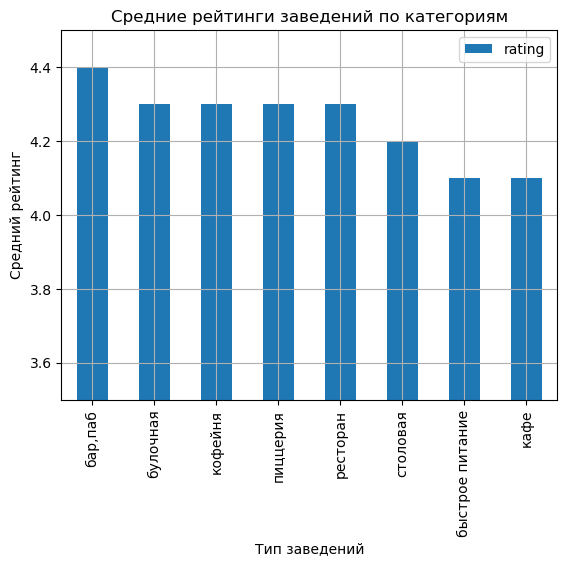

In [29]:
score_cat = data.groupby('category',as_index=False)['rating'].mean().round(1)
score_cat = score_cat.sort_values(by='rating',ascending=False)

score_cat.plot(x='category',y='rating',kind='bar',grid=True)
plt.title('Средние рейтинги заведений по категориям')

plt.ylim([3.5,4.5])
plt.xlabel('Тип заведений')
plt.ylabel('Средний рейтинг')
plt.show()

Средние рейтинги по категориям заведений колеблются от 4,0 до 4,5. Выше всего оценивают заведения в формате бара/паба, ниже всего - фастфуд, кафе и столовые. Остальные сегменты занимают примерно равную середину. 

#### Средние рейтинги по административным округам

In [30]:
score_dist = data.groupby('district',as_index=False)['rating'].mean().round(1)

In [31]:
# импортируем карту и хороплет
from folium import Map, Choropleth

# загружаем JSON-файл с границами округов Москвы
#state_geo = 'C:/Users/FORTREZZA/Desktop/Курс Дата-аналитика (Яндекс)/11. Презентация и оформление графиков/admin_level_geomap.geojson'

import json
with open('admin_level_geomap.geojson', 'r',encoding='utf-8') as f:
    state_geo = json.load(f)



# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=score_dist,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Самые лучшие заведения - в самом центре Москвы. Ниже всего ценятся заведения в СВАО и ЮВАО.

Отобразим все заведения на карте при помощи кластеров.

In [32]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

#### ТОП-15 улиц по количеству заведений

In [33]:
str_cnt = data.pivot_table(index = 'street',columns='category',values='address',aggfunc=['count'])
str_cnt.columns = str_cnt.columns.get_level_values(1)
str_cnt.index.name = None
str_cnt['ВСЕГО'] = str_cnt.sum(axis=1)

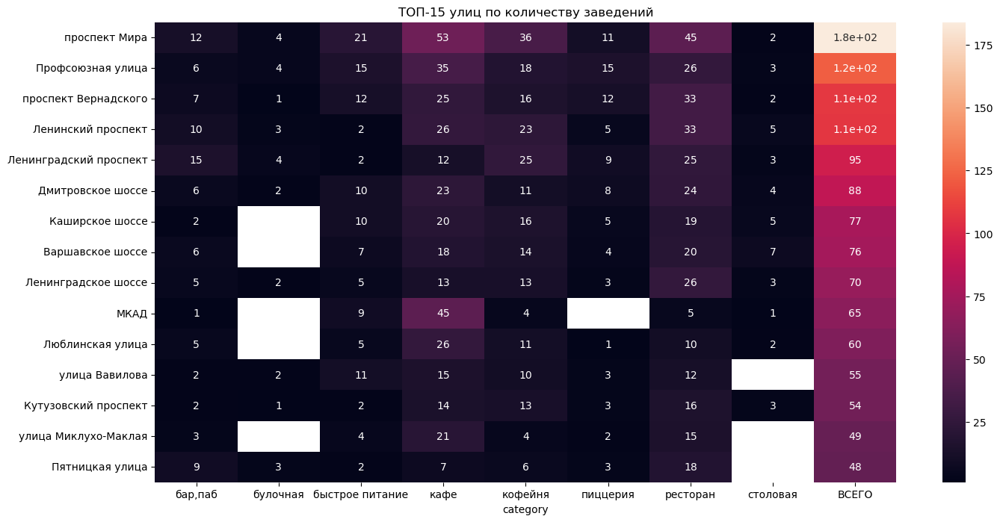

In [34]:
plt.figure(figsize=(16,8))
plt.title('ТОП-15 улиц по количеству заведений')
sns.heatmap(str_cnt.sort_values(by='ВСЕГО', ascending=False).head(15), annot=True)
plt.show()

Наибольшая концентрация заведений - на пр. Мира (184), Профсоюзной улице (122), пр. Вернадского (108) и Ленинском проспекте (107). Причем больше всего заведений в формате кафе и ресторана. 

А есть ли улицы, где всего один объект общепита?

In [35]:
temp = str_cnt[str_cnt['ВСЕГО'] == 1].reset_index()
temp_list = temp['index'].to_list()
single_st = data.query('street in @temp_list').groupby(['category'], as_index=False)[['address']].count()

In [36]:
# строим столбчатую диаграмму 
fig = px.bar(single_st.sort_values(by='address', ascending=True), # загружаем данные и заново их сортируем
             x='address', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='address' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве значений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Рейтинг количества заведений, являющихся единственными на улице',
                   xaxis_title='Количество заведений',
                   yaxis_title='Категория')
fig.show() # выводим график

Большинство заведений, являющихся единственными пунктами общественного питания на своей улице, относятся к категории кафе, однако встречаются и другие категории. Можно предположить, что сюда попадают заведения, располагающиеся в малопроходимых промзонах, и те, которые располагаются на тихих тупиковых улицах по городу.

#### Средний чек в зависимости от административного округа

In [37]:
avg_bill = data[data['middle_avg_bill'].notna()].groupby('district',as_index=False)['middle_avg_bill'].median()

In [38]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек по районам',
).add_to(m)

# выводим карту
m

Наиболее высокие средние чеки - в центре и в западных районах. Самые низкие - СВАО, ЮВАО и ЮАО. С высокой долей вероятности можно предполагать, что средний чек напрямую зависит от престижности района (для более детального раскрытия данного вопроса можно было бы поизучать рынок недвижимости в зависимости от района).

#### Распределение заведений с наиболее низким рейтингом

In [39]:
low_rat = data[data['rating']<=3] #примем, что низкооцененные заведения - это такие, рейтинг которым ниже либо равен 3

In [40]:
low_rat_cat = low_rat.groupby(['category'], as_index=False)[['address']].count()
# строим столбчатую диаграмму 
fig = px.bar(low_rat_cat.sort_values(by='address', ascending=True), # загружаем данные и заново их сортируем
             x='address', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='address' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве значений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Количество заведений с низким рейтингом по категориям',
                   xaxis_title='Количество заведений',
                   yaxis_title='Категория')
fig.show() # выводим график

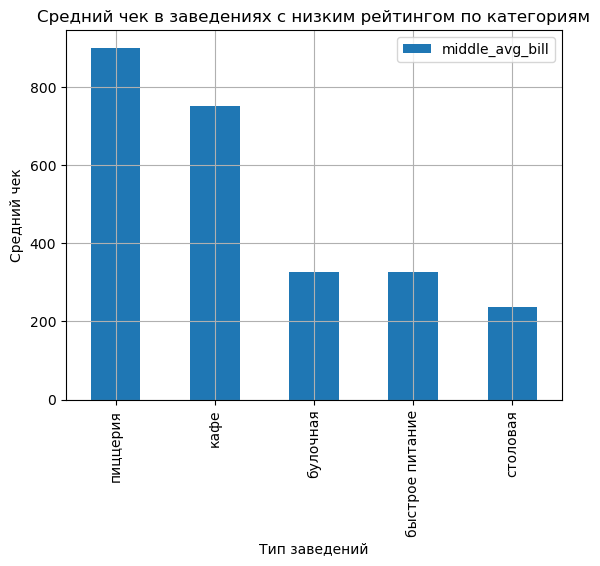

In [41]:
low_rat_bill = low_rat[low_rat['middle_avg_bill'].notna()].groupby(['category'], as_index=False)['middle_avg_bill'].median()
low_rat_bill = low_rat_bill.sort_values(by='middle_avg_bill',ascending=False)

low_rat_bill.plot(x='category',y='middle_avg_bill',kind='bar',grid=True)
plt.title('Средний чек в заведениях с низким рейтингом по категориям')

plt.xlabel('Тип заведений')
plt.ylabel('Средний чек')
plt.show()

Большинство таких заведений - это кафе, средний чек в которых чуть меньше 800 р. Интересно, есть ли среди таких заведений сети, которые стабильно получают плохие оценки?

In [42]:
low_rat[low_rat['chain']==True].groupby(['name'], as_index=False)[['address']].count().sort_values(
    by='address',ascending=False).head(15)

,name,address
55,Яндекс.Лавка,8
49,Чайхана,4
32,Крошка Картошка,3
7,DimSum & Co,2
14,Pizza Express 24,2
11,One Price Coffee,2
15,Wild Bean Cafe,2
6,Cofix,2
3,CofeFest,2
2,Cinnabon,2


Да, такие сети есть. Определенно, Яндекс Лавке стоит обратить внимание на своих фрачайзи, равно как Чайхане и другим. Еще одна интересная особенность: после ТОП-10 настоящего антирейтинга идут якобы сетевые заведения, представленные всего одной точкой. Либо их хозяева столь амбициозны, что нацелились на создание сети, либо это некорректно введенные данные. 

#### Распределение количества круглосуточных заведений по районам и категориям

In [43]:
day_night = data[data['is_24/7'] == True] #выбираем только круглосуточные заведения

In [44]:
dn_pivot = day_night.pivot_table(index = 'district',columns='category',values='address',aggfunc=['count'])
dn_pivot.columns = dn_pivot.columns.get_level_values(1)
dn_pivot.index.name = None
dn_pivot['ВСЕГО'] = dn_pivot.sum(axis=1)

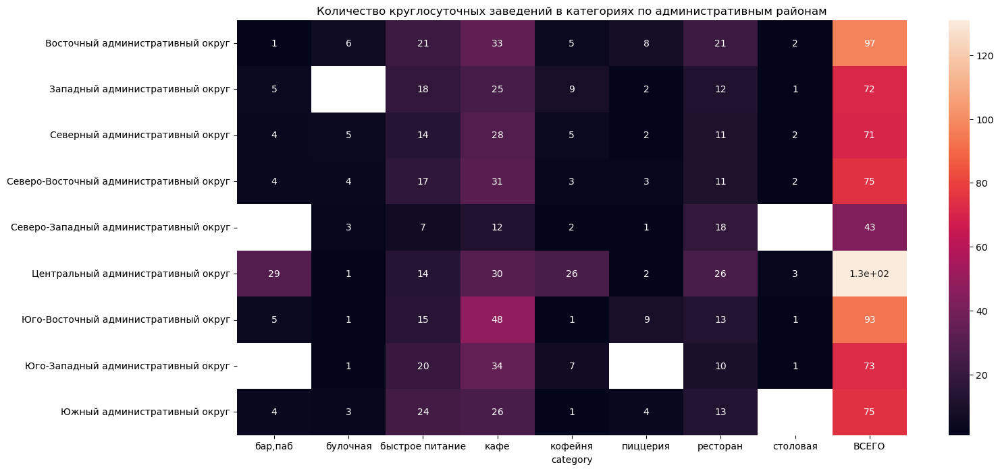

In [45]:
plt.figure(figsize=(16,8))
plt.title('Количество круглосуточных заведений в категориях по административным районам')
sns.heatmap(dn_pivot, annot=True)
plt.show()

Наибольшее количество круглосуточных заведений - в центральном районе, наименьшее - в СЗАО. Самый популярный формат круглосуточного заведения - кафе. При этом больше всего круглосуточных кафе - в ЮВАО. Практически отсутствуют столовые, работающие круглосуточно.

#### Выводы по исследовательскому анализу

В ходе исследовательского анализа установлены следующие особенности рынка заведений общественного питания Москвы:
- Наиболее популярны в Москве кафе (2378 или 28,3% рынка), рестораны (2043 или 24,3% рынка) и кофейни (1413 или 16,8% рынка);
- Наибольшее общее количество посадочных мест в ресторанах (154869 или 29,8% рынка), кафе (118770 или 22,8% рынка) и кофейнях (83511 или 16,1% рынка);
- Рестораны также является лидерами по среднему количеству мест в одном заведении (86). В барах и пабах среднее количество посадочных мест значительно больше, чем в кафе (86 / 60), однако общее количество мест меньше (58281 / 118770). Это объясняется тем, что кафе - самый популярный формат заведений. То же самое прослеживается относительно столовых - среднее количество большое (75,5), однако доля в общем числе малая (16359). Столовых гораздо меньше по городу, чем иных форматов. Кроме того, может иметь место вопрос престижа - хозяин скорее предпочтет отнести свое заведение к категории кафе, а не столовой. Тем временем, параметры кофеен более равномерно распределяются - они стабильно на 3-е месте и по количеству заведений (1413), и по общему число посадочных мест (83511), и по среднему количеству мест в одном заведении (80).
- Несетевых заведений примерно на 2000 или на 23,8% больше, чем сетевых;
- Среди сетевых заведений больше всего кафе (779), затем примерно на одинаковом уровне рестораны (730) и кофейни (720);
- Если рассматривать долю сетевых заведений внутри категории, то можно утверждать, что:
    - В категориях кафе, рестораны, быстрое питание примерно каждое третье заведение принадлежит сети;
    - В категориях кофейни и пиццерии примерно половина заведений принадлежит сети;
    - В категориях бары/пабы и столовые каждое четвертое заведение принадлежит сети;
    - Больше половины булочных - сетевые.
- Лидером среди сетевых заведений является "Шоколадница" (120), затем идут "Домино'с Пицца" (76) и "Додо Пицца" (74);
- Наибольшая концентрация заведений в ЦАО (около 2200). Наименьшая концентрация - в СЗАО (около 410);
- ЦАО также по сути единственный концентратор заведений в формате бара/паба (360);
- Количество кафе и кофеен в ЦАО примерно в 1,5-2,5 раза больше, чем в остальных округах, а ресторанов - в 3 раза;
- Количество заведений различных форматов в остальных районах примерно одинаковое, за исключением СЗАО;
- Средние рейтинги по категориям заведений колеблются от 4,0 до 4,5. Выше всего оценивают заведения в формате бара/паба, ниже всего - фастфуд, кафе и столовые. Остальные сегменты занимают примерно равную середину;
- Наибольшая концентрация заведений - на пр. Мира (184), Профсоюзной улице (122), пр. Вернадского (108) и Ленинском проспекте (107). Причем больше всего заведений в формате кафе и ресторана. Главная закономерность: чем длиннее улица, тем больше на ней может быть заведений;
- Большинство заведений, являющихся единственными пунктами общественного питания на своей улице, относятся к категории кафе, однако встречаются и другие категории. Если соотнести эту информацию с картой, то можно увидеть, что сюда попадают заведения, располагающиеся в малопроходимых промзонах, и те, которые располагаются на тихих тупиковых улицах по городу;
- Среди заведений с низким рейтингом (принято, что низкий рейтинг меньше либо равен 3) больше всего претензий к кафе и пиццериям. Другие категории, попавшие в эту статистику, относятся к быстрому питанию (булочные, фастфуды, столовые);
- Наибольшее количество круглосуточных заведений - в центральном районе, наименьшее - в СЗАО. Самый популярный формат круглосуточного заведения - кафе. Практически отсутствуют столовые, работающие круглосуточно.


### Кофейни

Что мы уже узнали о кофейнях в ходе исследовательского анализа:
- всего в датасет попало 1413 кофеен, занимающих долю рынка в 16,8%; 
- на хитмэпе п.3.6 увидели, что больше всего кофеен в центральном районе (около 430), меньше всего - в СЗАО (62), ЮВАО (89), ЮЗАО (96);
- больше всего кофеен (36) на пр. Мира;
- доли сетевых и несетевых кофеен распределяются примерно поровну (720 - 3-е место в рейтинге форматов сетевых заведений);
- есть некоторое количество круглосуточных кофеен, которые концентрируются в центральном районе.

Продолжим детализировать данный сегмент. Посчитаем общее количество круглосуточных кофеен и покажем их распределение на карте Москвы.



#### Круглосуточные кофейни

In [46]:
coffee = data.query('category == "кофейня"') #делаем интересующий нас срез данных

In [47]:
print('Круглосуточных кофеен: '+str(len(coffee[coffee['is_24/7'] == True])))

Круглосуточных кофеен: 59


In [48]:
dn_coffee = coffee[coffee['is_24/7'] == True]

In [49]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его на карту
def create_marker(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(m)

# применяем функцию для создания маркера к первым 5 записям датафрейма
dn_coffee.apply(create_marker, axis=1)
    
# выводим карту
m

На карте можно заметить следующие особенности:
- круглосуточные кофейни довольно плотно располагаются в центре, а те, что находятся на окраинах - как правило, кофейни при заправках;
- встречается различное написание одной и той же сети кофеен: Wild Bean, Wild Bean Cafe, The wild bean cafe или Кофейня One&Double, One And Double, One&Double.

Вычистим данные, чтобы построить корректное распределение рынка круглосуточных кофеен.

In [50]:
dn_coffee = dn_coffee.replace(['Wild Bean','The wild bean cafe'], 'Wild Bean Cafe')
dn_coffee = dn_coffee.replace(['Кофейня One&Double','One And Double'], 'One&Double')

In [51]:
dn_coffee_pivot = dn_coffee.groupby(['name'], as_index=False)[['address']].count()

# строим столбчатую диаграмму 
fig = px.bar(dn_coffee_pivot.sort_values(by='address', ascending=True), # загружаем данные и заново их сортируем
             x='address', # указываем столбец с данными для оси X
             y='name', # указываем столбец с данными для оси Y
             text='address' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве значений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Количество круглосуточных заведений с группировкой по сетям',
                   xaxis_title='Количество заведений',
                   yaxis_title='Наименование сети/заведения')
fig.show() # выводим график

Подавляющее большинство круглосуточных заведений принадлежит сетям Шоколадница (17), Wild Bean Cafe (12) и Кофемания (8). 
- Шоколадница и Кофемания располагаются, в основном, в центре, хотя есть отдельные заведения и в спальных районах;
- Wild Bean Cafe - на заправках на вылетных магистралях;
- Есть 10 независимых круглосуточных кофеен, располагающихся преимущественно в центре города.

#### Рейтинги кофеен

In [52]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m)

# выводим карту
m

По карте может сложится впечатление, что лучшие кофейни находятся в спальных районах и на окраинах города, однако это не совсем так. Сопоставив полученную информацию с хитмэпом п.3.6, мы поймем, что в ЮВАО, ЮЗАО, СЗАО наименьшее количество кофеен. Интересным же наблюдением является то, что в ВАО и САО, где количество кофеен примерно посередине рейтинга, кофени действительно ценятся! В центральном районе кофеен в 2,5-4 раза больше, чем в остальных районах, поэтому сравнение среднего рейтинга будет не корректным. Но даже это не мешает тому факту, что в ЦАО огромное количество хороших заведений.

#### Средняя стоимость чашки капучино

In [53]:
cup_pivot = coffee[coffee['middle_coffee_cup'].notna()].groupby(['district'], as_index=False)[['middle_coffee_cup']].median()

In [54]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cup_pivot,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средняя стоимость чашки капучино по районам',
).add_to(m)

# выводим карту
m

Дороже всего выпить чашечку капучино ожидаемо в центре, а также в ВАО и ЮАО. Детализируем цифры в виде рейтинга.

In [55]:
# строим столбчатую диаграмму 
fig = px.bar(cup_pivot.sort_values(by='middle_coffee_cup', ascending=True), # загружаем данные и заново их сортируем
             x='middle_coffee_cup', # указываем столбец с данными для оси X
             y='district', # указываем столбец с данными для оси Y
             text='middle_coffee_cup' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве значений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Средняя стоимость чашки капучино по районам',
                   xaxis_title='Средняя стоимость, руб.',
                   yaxis_title='Район')
fig.show() # выводим график

Самая дорогая чашка капучино - в центре (198) и на западе (190). Самая дешевая - на востоке (135).

#### Выводы и рекомендации относительно открытия кофейни

В Москве:
- 1413 кофеен, занимающих долю рынка общепита в 16,8%;
- больше всего кофеен в центральном районе (около 430), меньше всего - в СЗАО (62), ЮВАО (89), ЮЗАО (96);
- больше всего кофеен (36) на пр. Мира;
- доли сетевых и несетевых кофеен распределяются примерно поровну (720 - 3-е место в рейтинге форматов сетевых заведений общепита);
- параметры кофеен более равномерно распределяются - они стабильно на 3-е месте и по количеству заведений (1413), и по общему число посадочных мест (83511), и по среднему количеству мест в одном заведении (80), следовательно, потенциальное заведение в формате кофейни должно вмещать 80 человек.

Круглосуточные кофейни:
- в основном принадлежат сетям Шоколадница (17), Wild Bean Cafe (12) и Кофемания (8);
- Шоколадница и Кофемания располагаются, в основном, в центре, хотя есть отдельные заведения и в спальных районах, Wild Bean Cafe - на заправках на вылетных магистралях;
- есть 10 независимых круглосуточных кофеен, располагающихся преимущественно в центре города.

Лучшие кофейни: в центре города, на севере и на востоке.

Средняя стоимость чашки капучино:
- в центре и в западных районах: 190 руб
- в восточных районах: 140 руб
- в остальных районах: 160-165 руб

Рекомендации:
- кофейня в центре города будет конкурентоспособна в случае, если для нее, помимо отменного кофе, придумать интересный формат (например, тематические вечера, мероприятия, мастер-классы). Также можно совместить формат кофейни и кондитерской;
- в спальных районах и на окраине города кофейню можно открыть по франшизе - это знакомый бренд может сразу привлечь больше людей. Но в этом случае необходимо исследовать проходимость потенциальных точек;
- в круглосуточном формате смысла нет.

### Презентация

Презентация: <https://disk.yandex.ru/i/MBe_tD8IlbFsEQ>